## Raster Data

In scikit-map, the class RasterData is responsible for implement reading, processing and writing operations. The library provides a NDVI toy dataset that you can access by:

In [1]:
import os

os.environ["PROJ_LIB"] = "/skmap/lib/python3.12/site-packages/rasterio/proj_data"
os.environ["PROJ_DATA"] = "/skmap/lib/python3.12/site-packages/rasterio/proj_data"

In [2]:
import matplotlib.pyplot as plt
import numpy as np

from skmap.data import toy
from skmap.io import RasterData
backend='cpp' # numba, numpy

rdata = (
    RasterData.from_yaml(str(toy.LAYERS_YAML), base_path=str(toy.DATA_DIR), backend=backend)
    .filter("band == 'ndvi' and variant == 'gappy'")
    .read()
)


The data can be visualized through a static plot

/root/scikit-map/skmap/io/base.py:2443: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


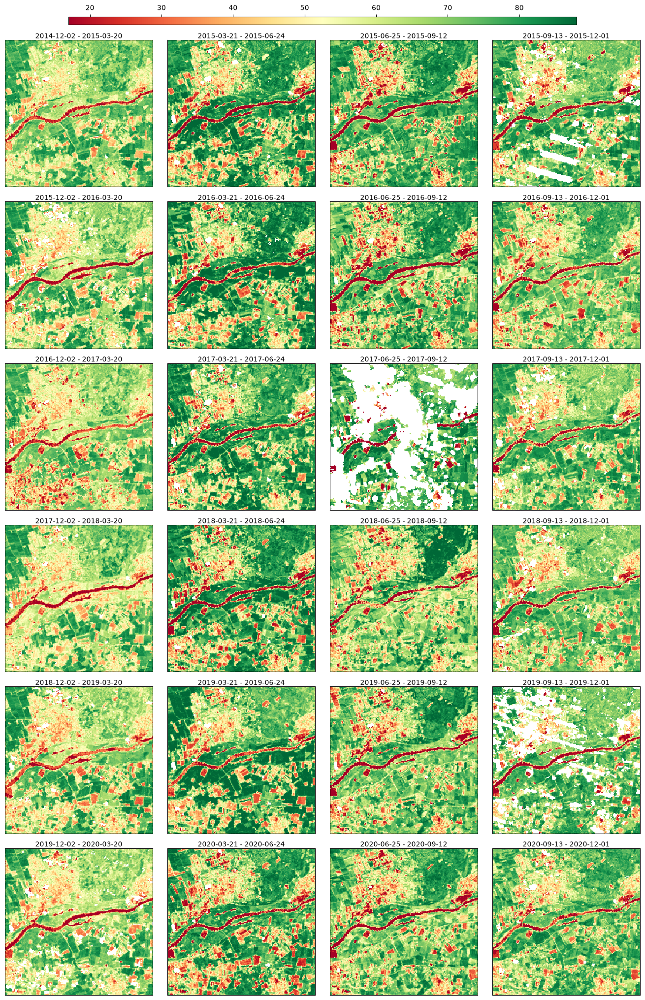

In [3]:
rdata.plot(cmap="RdYlGn", img_title_text="date")

Creating artificial gap at the begeinning of the time series to check that they do not get filled in case of no future images are used

2026-08-26 08:51:20,573	WARNING services.py:2248 -- WARNING: The object store is using /tmp/ray instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=10.24gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.
2026-08-26 08:51:23,782	INFO worker.py:2024 -- Started a local Ray instance.
/root/scikit-map/skmap/io/base.py:2443: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


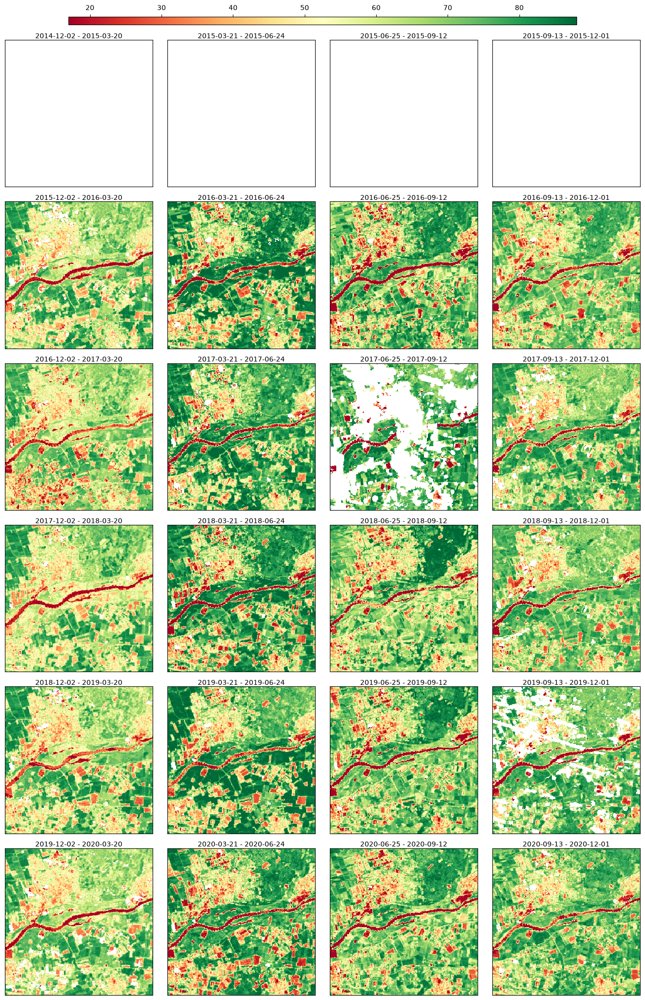

In [4]:
from skmap.parallel import put_shared

arr = rdata.array.get().copy()  # writable copy (object store is read-only)
arr[0:4, :] = np.nan  # gap the first 4 time steps
rdata.array = put_shared(arr)
rdata.plot(cmap="RdYlGn", img_title_text="date")

Gap-filling with SeasConv using only images from the past

/root/scikit-map/skmap/io/base.py:2443: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


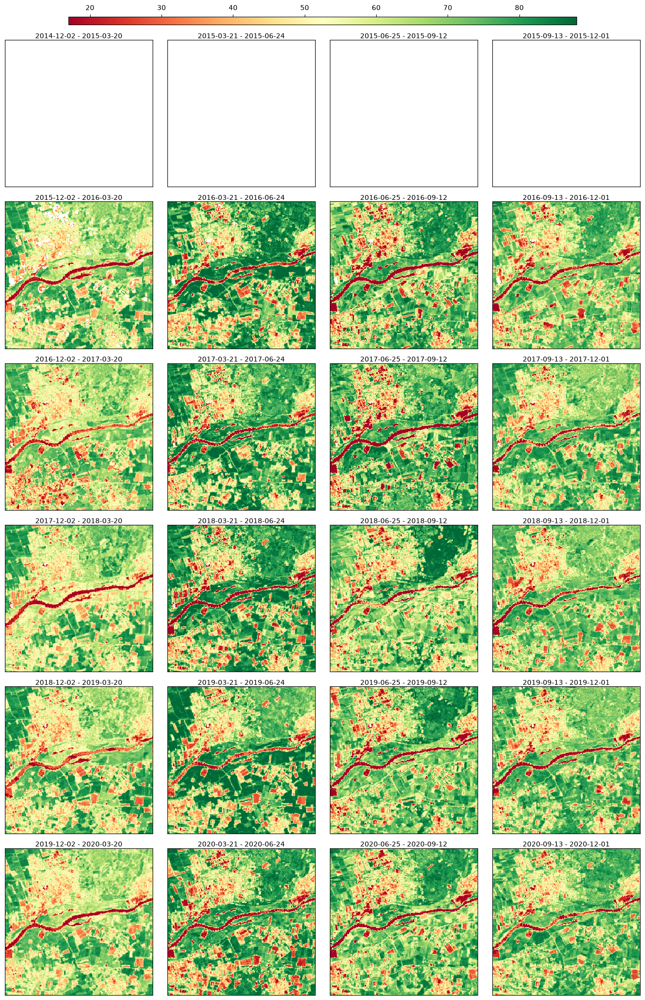

In [5]:
from skmap.io import process

n_imag = rdata.array.shape[0]
seasconv = process.SeasConvFill(season_size=4)
conv_vect = seasconv._compute_conv_mat_row(n_imag)

conv_vect_past = conv_vect
conv_vect_future = conv_vect * 0

rdata = rdata.run(
    process.SeasConvFill(
        season_size=4, conv_vect_past=conv_vect_past, conv_vect_future=conv_vect_future
    ),
    drop_input=True,
)
rdata.plot(cmap="RdYlGn", img_title_text="date")

Creating a vector to visualize the weights used from SeasConv

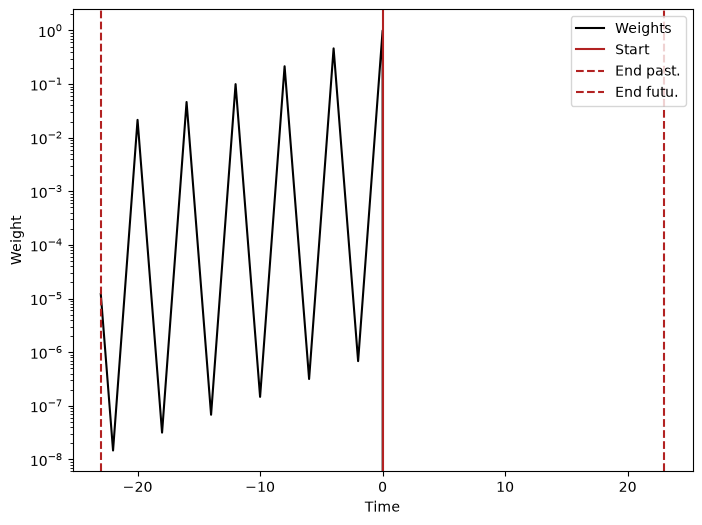

In [6]:
conv_vect_plot = np.concatenate((conv_vect_past[::-1][:-1], (1,), conv_vect_future[1:]))

plt.figure(figsize=(8, 6))
t = np.arange(n_imag * 2 - 1) - n_imag + 1
ts = 0  # Index of the time series for the range to visualize

plt.semilogy(t, conv_vect_plot, "k", label="Weights")
plt.axvline(x=t[n_imag - ts - 1], color="firebrick", label="Start")
plt.axvline(x=t[-1], linestyle="--", color="firebrick", label="End past.")
plt.axvline(x=t[0], linestyle="--", color="firebrick", label="End futu.")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Weight")
plt.savefig("weights_no_future.png", dpi=600)
plt.show()

Now we can gapfill the first time steps with data from the future. 

/root/scikit-map/skmap/io/base.py:2443: UserWarning: Adding colorbar to a different Figure <Figure size 640x480 with 1 Axes> than <Figure size 1290x1940 with 25 Axes> which fig.colorbar is called on.
  cbar_ax = grd_fig.colorbar(


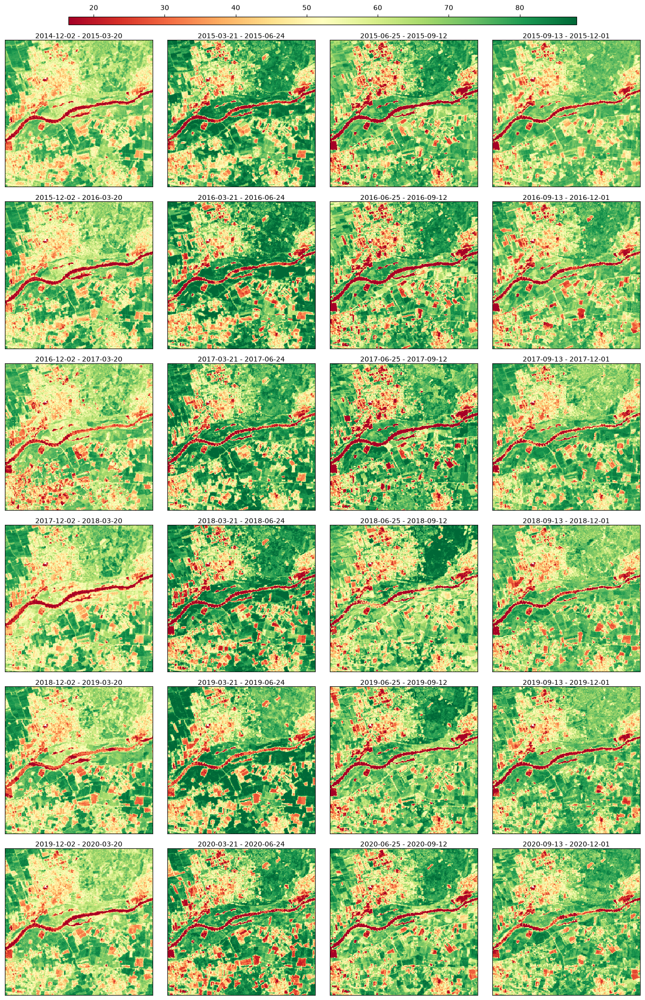

In [7]:
from skmap.io import process

n_imag = rdata.array.shape[0]
seasconv = process.SeasConvFill(season_size=4)

conv_vect_past = conv_vect
conv_vect_future = conv_vect

rdata = rdata.run(
    process.SeasConvFill(
        season_size=4, conv_vect_past=conv_vect_past, conv_vect_future=conv_vect_future
    ),
    drop_input=True,
)
rdata.plot(cmap="RdYlGn", img_title_text="date")

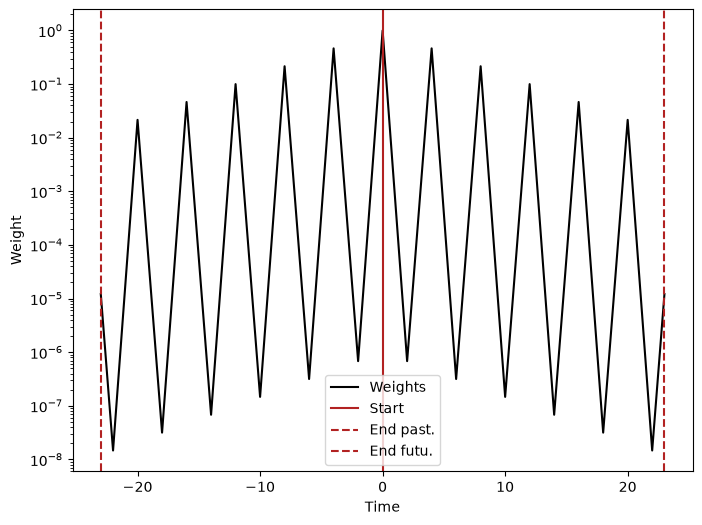

In [8]:
conv_vect_plot = np.concatenate((conv_vect_past[::-1][:-1], (1,), conv_vect_future[1:]))

plt.figure(figsize=(8, 6))
t = np.arange(n_imag * 2 - 1) - n_imag + 1
ts = 0  # Index of the time series for the range to visualize

plt.semilogy(t, conv_vect_plot, "k", label="Weights")
plt.axvline(x=t[n_imag - ts - 1], color="firebrick", label="Start")
plt.axvline(x=t[-1], linestyle="--", color="firebrick", label="End past.")
plt.axvline(x=t[0], linestyle="--", color="firebrick", label="End futu.")
plt.legend()
plt.xlabel("Time")
plt.ylabel("Weight")
plt.savefig("weights_no_future.png", dpi=600)
plt.show()